In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
from tabulate import tabulate
import scipy.stats  # For entropy calculation

In [2]:
# List of image paths
image_paths = [
    '/content/Dark image.jpeg',  # Dark image
    '/content/Bright image.jpeg',  # Bright image
    '/content/clear edges.png',  # Clear edges
    '/content/blur.jpeg',  # Blurry image
    '/content/high details.jpeg',  # High detail
    '/content/low details.jpeg'   # Low detail
]

In [3]:
# Function to compute evaluation metrics
def compute_metrics(original, processed):
    if len(original.shape) == 3:
        original = cv2.cvtColor(original, cv2.COLOR_BGR2GRAY)
    if len(processed.shape) == 3:
        processed = cv2.cvtColor(processed, cv2.COLOR_BGR2GRAY)

    # Contrast (standard deviation of pixel intensities)
    contrast = np.std(processed)

    # PSNR and SSIM (handle potential data range issues)
    psnr = peak_signal_noise_ratio(original, processed, data_range=255)
    ssim = structural_similarity(original, processed, data_range=255)

    return contrast, psnr, ssim


In [ ]:
# Function to optimize CLAHE clipLimit based on image entropy
def optimize_clahe_clip_limit(img):
    if len(img.shape) == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    hist, _ = np.histogram(img, bins=256, range=(0, 255), density=True)
    entropy = scipy.stats.entropy(hist + 1e-10)  # Avoid log(0)
    clip_limit = max(1.0, 4.0 - entropy / 2.0)
    return clip_limit

In [ ]:
# Function to apply Standard Histogram Equalization
def standard_histogram_equalization(img):
    if len(img.shape) == 3:  
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    return cv2.equalizeHist(img)

In [6]:
# Function to apply CLAHE (grayscale only)
def apply_clahe(img, clip_limit=2.0, tile_grid_size=(8, 8)):
    if len(img.shape) == 3:  # Convert to grayscale if color
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
    return clahe.apply(img)

In [7]:
# Function to apply Adaptive Histogram Equalization (supports color images)
def adaptive_hist_equalization(img, clip_limit=2.0):
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=(8, 8))
    if len(img.shape) == 2:
        return clahe.apply(img)
    else:
        channels = cv2.split(img)
        eq_channels = [clahe.apply(c) for c in channels]
        return cv2.merge(eq_channels)

In [ ]:
# Function to apply Adaptive Histogram Equalization in HSV
def adaptive_hist_hsv(img, clip_limit=2.0):
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv)
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=(8, 8))
    v_eq = clahe.apply(v)  # Apply CLAHE to V channel only
    hsv_eq = cv2.merge([h, s, v_eq])
    return cv2.cvtColor(hsv_eq, cv2.COLOR_HSV2BGR) 

In [9]:
# Function to apply various filters
def apply_filters(img):
    results = {}
    if len(img.shape) == 3:  # Convert to grayscale for some filters
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
        gray = img

    # Smoothing Filters
    results['Gaussian Blur'] = cv2.GaussianBlur(img, (5, 5), 0)
    results['Median Blur'] = cv2.medianBlur(img, 5)
    results['Bilateral Filter'] = cv2.bilateralFilter(img, 9, 75, 75)
    results['Non-Local Means'] = cv2.fastNlMeansDenoisingColored(img) if len(img.shape) == 3 else cv2.fastNlMeansDenoising(gray)

    # Sharpening Filter
    sharpening_kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
    results['Sharpened'] = cv2.filter2D(img, -1, sharpening_kernel)

    # Edge Detection
    results['Canny Edges'] = cv2.Canny(gray, 100, 200)
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=5)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=5)
    results['Sobel Edges'] = cv2.magnitude(sobel_x, sobel_y)

    # Morphological Operations
    kernel = np.ones((3, 3), np.uint8)
    results['Dilation'] = cv2.dilate(gray, kernel, iterations=1)
    results['Erosion'] = cv2.erode(gray, kernel, iterations=1)

    return results

In [10]:
# Function to plot and display results
def plot_results(original, std_hist, clahe, adapt_hist, adapt_hsv, filters, title, metrics):
    # Calculate total number of images (original + 4 hist methods + filters)
    total_images = 5 + len(filters)  # Now 14 images (5 + 9 filters)
    # Use a 5x3 grid to accommodate up to 15 images
    rows, cols = 5, 3

    plt.figure(figsize=(15, 25))  # Adjusted for 5x3 grid

    # Original Image
    plt.subplot(rows, cols, 1)
    plt.imshow(original, cmap='gray' if len(original.shape) == 2 else None)
    plt.title('Original')
    plt.axis('off')

    # Standard Histogram Equalization
    plt.subplot(rows, cols, 2)
    plt.imshow(std_hist, cmap='gray')
    plt.title(f'Standard Hist Eq\nContrast: {metrics["std_hist"][0]:.2f}, PSNR: {metrics["std_hist"][1]:.2f}, SSIM: {metrics["std_hist"][2]:.2f}')
    plt.axis('off')

    # CLAHE
    plt.subplot(rows, cols, 3)
    plt.imshow(clahe, cmap='gray')
    plt.title(f'CLAHE\nContrast: {metrics["clahe"][0]:.2f}, PSNR: {metrics["clahe"][1]:.2f}, SSIM: {metrics["clahe"][2]:.2f}')
    plt.axis('off')

    # Adaptive Histogram Equalization
    plt.subplot(rows, cols, 4)
    plt.imshow(adapt_hist, cmap='gray' if len(adapt_hist.shape) == 2 else None)
    plt.title(f'Adaptive Hist Eq\nContrast: {metrics["adapt_hist"][0]:.2f}, PSNR: {metrics["adapt_hist"][1]:.2f}, SSIM: {metrics["adapt_hist"][2]:.2f}')
    plt.axis('off')

    # Adaptive Histogram Equalization (HSV)
    plt.subplot(rows, cols, 5)
    plt.imshow(adapt_hsv, cmap='gray' if len(adapt_hsv.shape) == 2 else None)
    plt.title(f'Adaptive Hist HSV\nContrast: {metrics["adapt_hsv"][0]:.2f}, PSNR: {metrics["adapt_hsv"][1]:.2f}, SSIM: {metrics["adapt_hsv"][2]:.2f}')
    plt.axis('off')

    # Filters
    filter_names = list(filters.keys())
    for i, (name, filtered_img) in enumerate(filters.items(), start=6):
        if i <= rows * cols:
            plt.subplot(rows, cols, i)
            plt.imshow(filtered_img, cmap='gray' if len(filtered_img.shape) == 2 else None)
            plt.title(f'{name}\nContrast: {metrics[name][0]:.2f}, PSNR: {metrics[name][1]:.2f}, SSIM: {metrics[name][2]:.2f}')
            plt.axis('off')

    plt.suptitle(title)
    plt.tight_layout()
    plt.show()


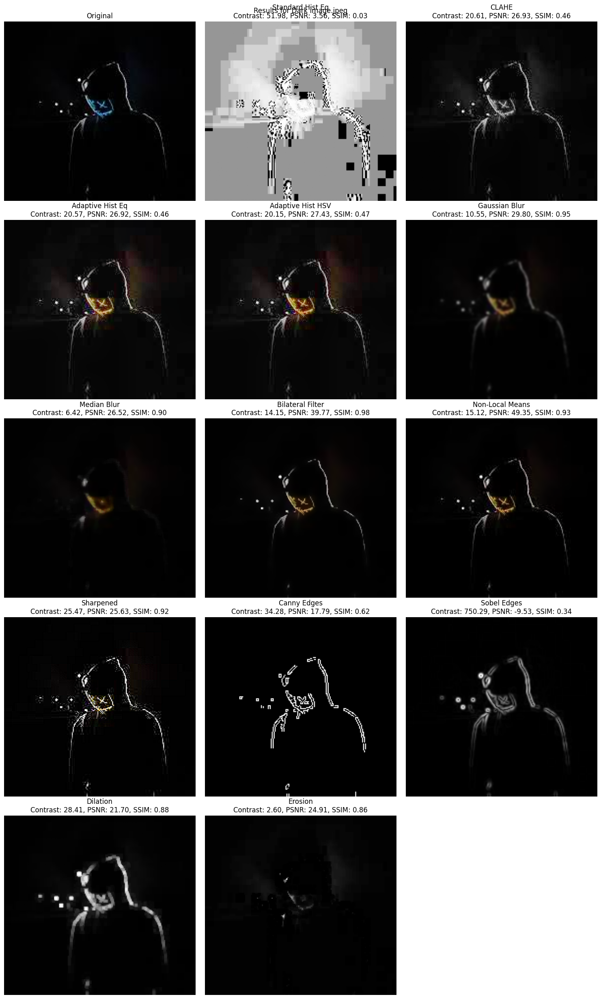

Displayed results for /content/Dark image.jpeg


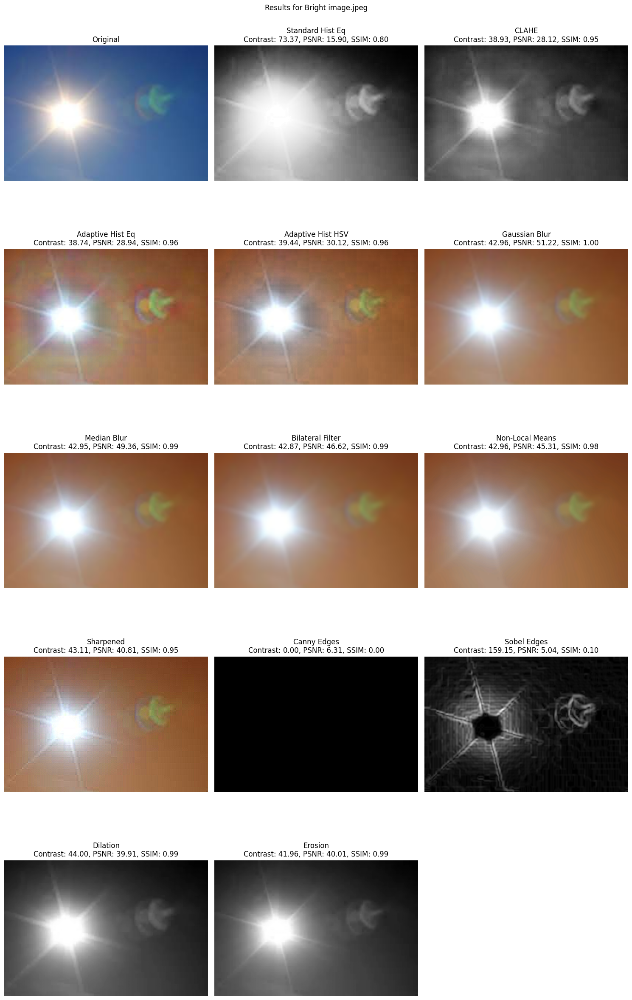

Displayed results for /content/Bright image.jpeg


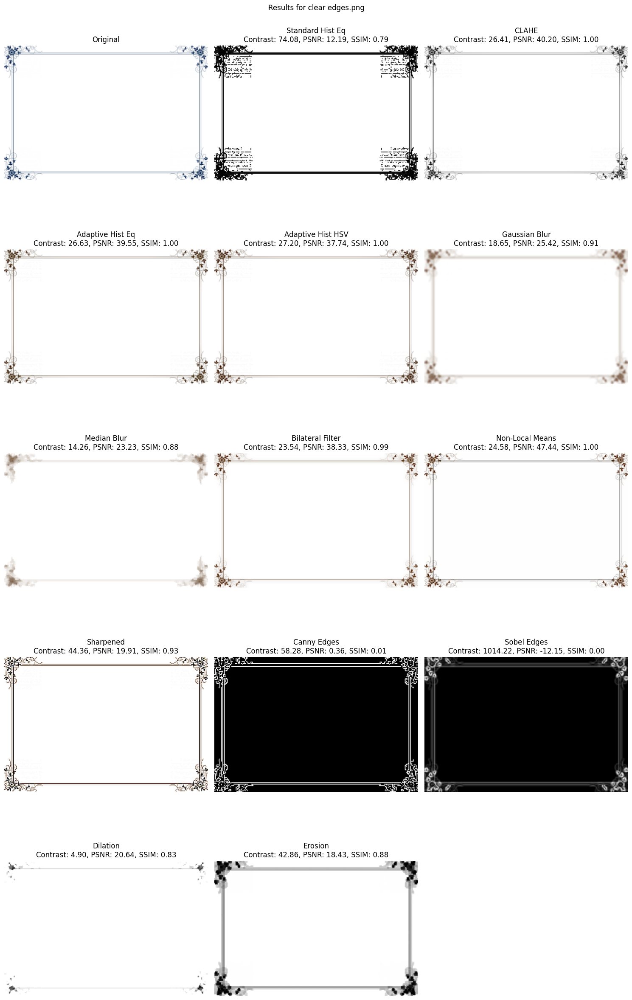

Displayed results for /content/clear edges.png


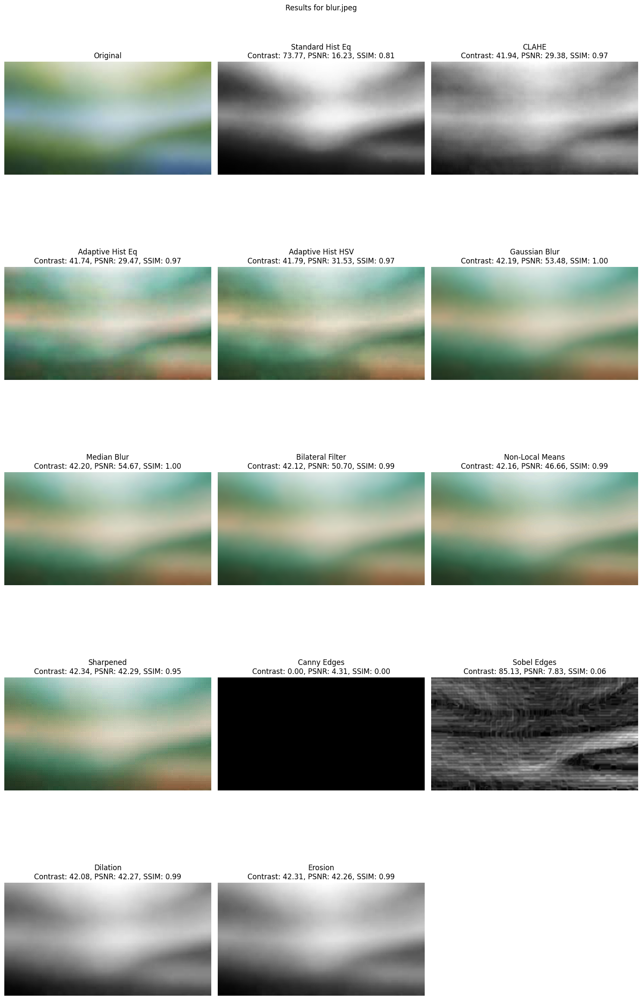

Displayed results for /content/blur.jpeg


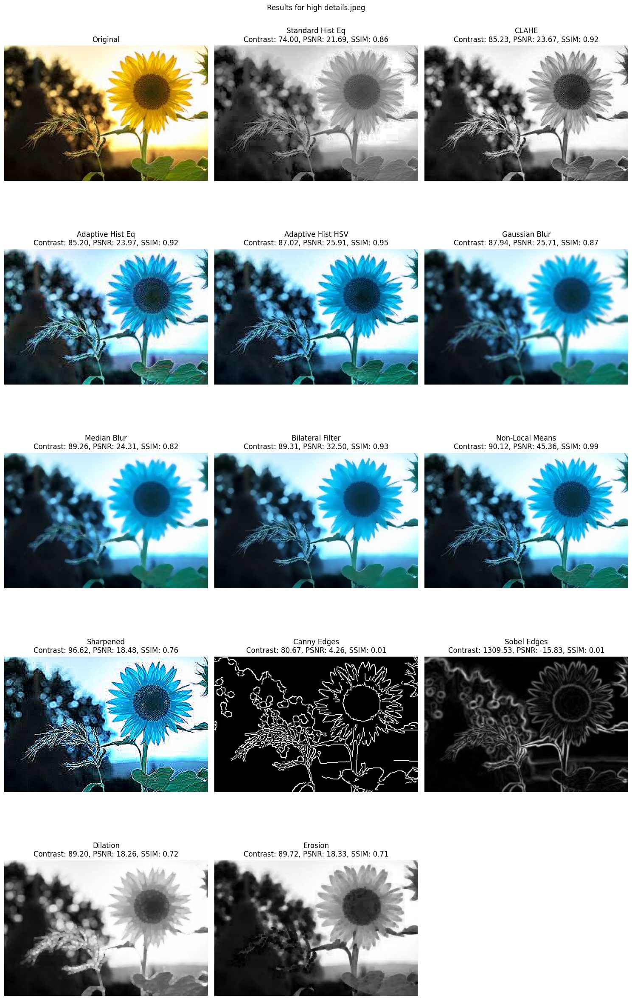

Displayed results for /content/high details.jpeg


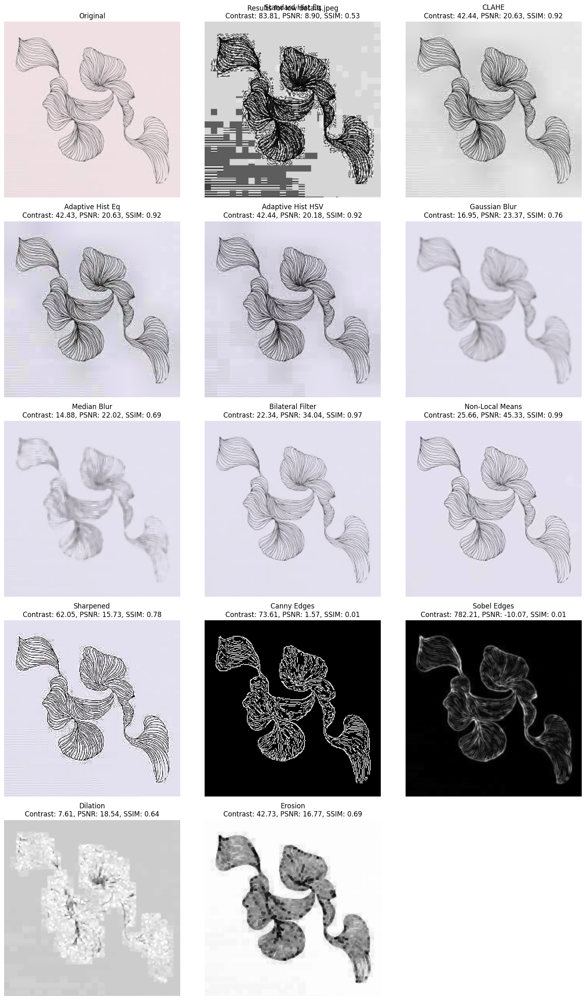

Displayed results for /content/low details.jpeg

Summary of Results:
+-------------------+---------------------+------------------+-----------------------+----------------------+--------------------------+------------------------+-----------------------------+----------------------------+----------------------+------------------------+------------------------+---------------------+--------------------+-----------------+--------------+-------------------+------------------+----------------------+--------------------+-------------------------+------------------------+------------------+--------------------+--------------------+-----------------+----------------+-----------------+--------------+-------------------+------------------+----------------------+--------------------+-------------------------+------------------------+------------------+--------------------+--------------------+-----------------+----------------+
| Image             |   Std Hist Contrast |   CLAHE Contrast |   Ada

In [11]:
# Summary table for all images
summary_data = []

# Process each image
for img_path in image_paths:
    # Load image
    img = cv2.imread(img_path)
    if img is None:
        print(f"Failed to load {img_path}")
        continue

    # Convert to RGB for visualization
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Optimize CLAHE clip limit
    clip_limit = optimize_clahe_clip_limit(img)

    # Apply Histogram Equalization
    std_hist = standard_histogram_equalization(img)
    clahe_img = apply_clahe(img, clip_limit=clip_limit)
    adapt_hist = adaptive_hist_equalization(img, clip_limit=clip_limit)
    adapt_hsv = adaptive_hist_hsv(img, clip_limit=clip_limit)

    # Apply Filters
    filtered_images = apply_filters(img)

    # Compute metrics
    metrics = {
        'std_hist': compute_metrics(img, std_hist),
        'clahe': compute_metrics(img, clahe_img),
        'adapt_hist': compute_metrics(img, adapt_hist),
        'adapt_hsv': compute_metrics(img, adapt_hsv)
    }
    for name, filtered_img in filtered_images.items():
        metrics[name] = compute_metrics(img, filtered_img)

    # Plot and display results
    plot_results(img_rgb, std_hist, clahe_img, adapt_hist, adapt_hsv, filtered_images,
                 f'Results for {os.path.basename(img_path)}', metrics)
    print(f"Displayed results for {img_path}")

    # Collect summary data
    summary_row = [os.path.basename(img_path)]
    for method in ['std_hist', 'clahe', 'adapt_hist', 'adapt_hsv'] + list(filtered_images.keys()):
        contrast, psnr, ssim = metrics[method]
        summary_row.extend([f"{contrast:.2f}", f"{psnr:.2f}", f"{ssim:.2f}"])
    summary_data.append(summary_row)

# Print summary table
headers = ['Image'] + [f'{m} Contrast' for m in ['Std Hist', 'CLAHE', 'Adapt Hist', 'Adapt HSV'] + list(filtered_images.keys())] + \
          [f'{m} PSNR' for m in ['Std Hist', 'CLAHE', 'Adapt Hist', 'Adapt HSV'] + list(filtered_images.keys())] + \
          [f'{m} SSIM' for m in ['Std Hist', 'CLAHE', 'Adapt Hist', 'Adapt HSV'] + list(filtered_images.keys())]
print("\nSummary of Results:")
print(tabulate(summary_data, headers=headers, tablefmt='grid'))